In [0]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
from pyspark.sql import SparkSession
from pyspark.sql.functions import isnan, when, count, col, unix_timestamp
from pyspark.ml import Pipeline
from pyspark.sql.types import IntegerType, DoubleType
from pyspark.sql import SparkSession

#Initialize Spark session
spark = SparkSession.builder.appName("Fraud Detection with Advanced Techniques").getOrCreate()


In [0]:
# Load data
df1 = spark.read.format("csv").option("header", "true").load("dbfs:/FileStore/shared_uploads/mrajakum@gmu.edu/fraud_dataset.csv")



In [0]:
# Show the first few rows
df1.show(5)
print("Data Schema:")
df1.printSchema()

+----+-----------+---+------+----------+-------------+-----------+-------------------+------+-----+---------------------+----------------------+-----------+--------------------+-----------------+------------+--------------+
|step|   customer|age|gender|zipcodeOri|     merchant|zipMerchant|           category|amount|fraud|transaction_frequency|avg_transaction_amount|time_of_day|merchant_interaction|amount_change_pct|zip_distance|category_count|
+----+-----------+---+------+----------+-------------+-----------+-------------------+------+-----+---------------------+----------------------+-----------+--------------------+-----------------+------------+--------------+
|   0|C1093826151|4.0|   'M'|     28007| 'M348934600'|      28007|'es_transportation'|  4.55|    0|                  167|     28.24071856287425|          0|                 154|              0.0|           0|           154|
|   0| C352968107|2.0|   'M'|     28007| 'M348934600'|      28007|'es_transportation'| 39.68|    0|     

## Data Cleaning 

In [0]:
# --- EDA and Data Preprocessing ---

# Check for missing values
missing_values = df1.select([count(when(col(c).isNull() | isnan(col(c)), c)).alias(c) for c in df1.columns])
print("Missing values in each column before dropping duplicates:")
missing_values.show()

# Drop duplicates
df1 = df1.dropDuplicates()

# Check missing values again
missing_values_after = df1.select([count(when(col(c).isNull() | isnan(col(c)), c)).alias(c) for c in df1.columns])
print("Missing values in each column after dropping duplicates:")
missing_values_after.show()

# Drop rows with missing values
df1 = df1.dropna()

Missing values in each column before dropping duplicates:
+----+--------+----+------+----------+--------+-----------+--------+------+-----+---------------------+----------------------+-----------+--------------------+-----------------+------------+--------------+
|step|customer| age|gender|zipcodeOri|merchant|zipMerchant|category|amount|fraud|transaction_frequency|avg_transaction_amount|time_of_day|merchant_interaction|amount_change_pct|zip_distance|category_count|
+----+--------+----+------+----------+--------+-----------+--------+------+-----+---------------------+----------------------+-----------+--------------------+-----------------+------------+--------------+
|   0|       0|1178|     0|         0|       0|          0|       0|     0|    0|                    0|                     0|          0|                   0|                0|           0|             0|
+----+--------+----+------+----------+--------+-----------+--------+------+-----+---------------------+---------------

In [0]:
# General statistics
df1.describe().show()

# Count of rows and columns
print(f"Number of rows: {df1.count()}")
print(f"Number of columns: {len(df1.columns)}")


+-------+-----------------+-----------+------------------+------+----------+-------------+-----------+--------------------+-----------------+-------------------+---------------------+----------------------+------------------+--------------------+--------------------+------------+-----------------+
|summary|             step|   customer|               age|gender|zipcodeOri|     merchant|zipMerchant|            category|           amount|              fraud|transaction_frequency|avg_transaction_amount|       time_of_day|merchant_interaction|   amount_change_pct|zip_distance|   category_count|
+-------+-----------------+-----------+------------------+------+----------+-------------+-----------+--------------------+-----------------+-------------------+---------------------+----------------------+------------------+--------------------+--------------------+------------+-----------------+
|  count|           593465|     593465|            593465|593465|    593465|       593465|     593465| 

## EDA

In [0]:
# Convert to Pandas
df1_pandas = df1.toPandas()


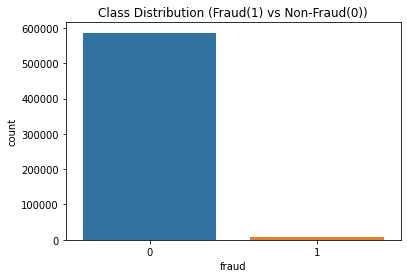

In [0]:
import matplotlib.pyplot as plt
import seaborn as sns

# Class distribution
sns.countplot(x="fraud", data=df1_pandas)
plt.title("Class Distribution (Fraud(1) vs Non-Fraud(0))")
plt.show()


In [0]:
display(dbutils.fs.ls('dbfs:/FileStore/tables/'))

path,name,size,modificationTime
dbfs:/FileStore/tables/EmployeeAttrition-1.csv,EmployeeAttrition-1.csv,227974,1727226770000
dbfs:/FileStore/tables/EmployeeAttrition-2.csv,EmployeeAttrition-2.csv,227974,1727226821000
dbfs:/FileStore/tables/EmployeeAttrition.csv,EmployeeAttrition.csv,227974,1727217212000
dbfs:/FileStore/tables/fraud_dataset.csv,fraud_dataset.csv,76169722,1733500583000


In [0]:
# File location and type
file_location = "/FileStore/tables/fraud_dataset.csv"
file_type = "csv"

# CSV options
infer_schema = "false"
first_row_is_header = "true"
delimiter = ","

# The applied options are for CSV files. For other file types, these will be ignored.
df = spark.read.format(file_type) \
  .option("inferSchema", infer_schema) \
  .option("header", first_row_is_header) \
  .option("sep", delimiter) \
  .load(file_location)

display(df)

step,customer,age,gender,zipcodeOri,merchant,zipMerchant,category,amount,fraud,transaction_frequency,avg_transaction_amount,time_of_day,merchant_interaction,amount_change_pct,zip_distance,category_count
0,C1093826151,4.0,'M',28007,'M348934600',28007,'es_transportation',4.55,0,167,28.24071856287425,0,154,0.0,0,154
0,C352968107,2.0,'M',28007,'M348934600',28007,'es_transportation',39.68,0,169,32.66136094674557,0,65,0.0,0,150
0,C2054744914,4.0,'F',28007,'M1823072687',28007,'es_transportation',26.89,0,65,41.44369230769231,0,22,0.0,0,45
0,C1760612790,3.0,'M',28007,'M348934600',28007,'es_transportation',17.25,0,171,30.338771929824564,0,55,0.0,0,153
0,C757503768,5.0,'M',28007,'M348934600',28007,'es_transportation',35.72,0,145,31.696758620689653,0,73,0.0,0,128
0,C1315400589,3.0,'F',28007,'M348934600',28007,'es_transportation',25.81,0,175,32.79748571428571,0,6,0.0,0,146
0,C765155274,1.0,'F',28007,'M348934600',28007,'es_transportation',9.1,0,176,43.25244318181819,0,34,0.0,0,145
0,C202531238,4.0,'F',28007,'M348934600',28007,'es_transportation',21.17,0,173,28.568959537572255,0,38,0.0,0,155
0,C105845174,3.0,'M',28007,'M348934600',28007,'es_transportation',32.4,0,106,33.10198113207547,0,91,0.0,0,91
0,C39858251,5.0,'F',28007,'M348934600',28007,'es_transportation',35.4,0,147,28.629387755102037,0,80,0.0,0,125


In [0]:
# Create a view or table

temp_table_name = "fraud_dataset_csv"

df.createOrReplaceTempView(temp_table_name)

In [0]:
%sql

/* Query the created temp table in a SQL cell */

select * from `fraud_dataset_csv`

step,customer,age,gender,zipcodeOri,merchant,zipMerchant,category,amount,fraud,transaction_frequency,avg_transaction_amount,time_of_day,merchant_interaction,amount_change_pct,zip_distance,category_count
0,C1093826151,4.0,'M',28007,'M348934600',28007,'es_transportation',4.55,0,167,28.24071856287425,0,154,0.0,0,154
0,C352968107,2.0,'M',28007,'M348934600',28007,'es_transportation',39.68,0,169,32.66136094674557,0,65,0.0,0,150
0,C2054744914,4.0,'F',28007,'M1823072687',28007,'es_transportation',26.89,0,65,41.44369230769231,0,22,0.0,0,45
0,C1760612790,3.0,'M',28007,'M348934600',28007,'es_transportation',17.25,0,171,30.338771929824564,0,55,0.0,0,153
0,C757503768,5.0,'M',28007,'M348934600',28007,'es_transportation',35.72,0,145,31.696758620689653,0,73,0.0,0,128
0,C1315400589,3.0,'F',28007,'M348934600',28007,'es_transportation',25.81,0,175,32.79748571428571,0,6,0.0,0,146
0,C765155274,1.0,'F',28007,'M348934600',28007,'es_transportation',9.1,0,176,43.25244318181819,0,34,0.0,0,145
0,C202531238,4.0,'F',28007,'M348934600',28007,'es_transportation',21.17,0,173,28.568959537572255,0,38,0.0,0,155
0,C105845174,3.0,'M',28007,'M348934600',28007,'es_transportation',32.4,0,106,33.10198113207547,0,91,0.0,0,91
0,C39858251,5.0,'F',28007,'M348934600',28007,'es_transportation',35.4,0,147,28.629387755102037,0,80,0.0,0,125


In [0]:
# With this registered as a temp view, it will only be available to this particular notebook. If you'd like other users to be able to query this table, you can also create a table from the DataFrame.
# Once saved, this table will persist across cluster restarts as well as allow various users across different notebooks to query this data.
# To do so, choose your table name and uncomment the bottom line.

permanent_table_name = "fraud_dataset_csv"

# df.write.format("parquet").saveAsTable(permanent_table_name)

In [0]:
%sql
-- Distribution of Target Variable (Fraud Column)
SELECT fraud, COUNT(*) AS count
FROM fraud_dataset_csv
GROUP BY fraud;

fraud,count
0,587443
1,7200


In [0]:
%sql
-- Basic Overview of the Dataset
SELECT * 
FROM fraud_dataset_csv
LIMIT 5;

step,customer,age,gender,zipcodeOri,merchant,zipMerchant,category,amount,fraud,transaction_frequency,avg_transaction_amount,time_of_day,merchant_interaction,amount_change_pct,zip_distance,category_count
0,C1093826151,4.0,'M',28007,'M348934600',28007,'es_transportation',4.55,0,167,28.24071856287425,0,154,0.0,0,154
0,C352968107,2.0,'M',28007,'M348934600',28007,'es_transportation',39.68,0,169,32.66136094674557,0,65,0.0,0,150
0,C2054744914,4.0,'F',28007,'M1823072687',28007,'es_transportation',26.89,0,65,41.44369230769231,0,22,0.0,0,45
0,C1760612790,3.0,'M',28007,'M348934600',28007,'es_transportation',17.25,0,171,30.338771929824564,0,55,0.0,0,153
0,C757503768,5.0,'M',28007,'M348934600',28007,'es_transportation',35.72,0,145,31.696758620689653,0,73,0.0,0,128


In [0]:
%sql
-- Schema and count of rows and columns are usually handled by the database system tools
SELECT COUNT(*) AS row_count
FROM fraud_dataset_csv;

row_count
594643


In [0]:
%sql
-- Descriptive Statistics for Numeric Columns
SELECT 
    AVG(amount) AS avg_amount,
    MIN(amount) AS min_amount,
    MAX(amount) AS max_amount,
    STDDEV(amount) AS stddev_amount,
    COUNT(*) AS total_transactions
FROM fraud_dataset_csv;


avg_amount,min_amount,max_amount,stddev_amount,total_transactions
37.89013530807562,0.0,996.38,111.40283093084048,594643


In [0]:
%sql
-- Missing Value Analysis
SELECT 
    COUNT(CASE WHEN age IS NULL THEN 1 END) AS missing_age,
    COUNT(CASE WHEN amount IS NULL THEN 1 END) AS missing_amount,
    COUNT(CASE WHEN transaction_frequency IS NULL THEN 1 END) AS missing_transaction_frequency,
    -- Add all other columns
    COUNT(*) AS total_rows
FROM fraud_dataset_csv;



missing_age,missing_amount,missing_transaction_frequency,total_rows
1178,0,0,594643


In [0]:
%sql
-- Outlier Detection (Basic Outlier Statistics for Amount)
SELECT 
    PERCENTILE_CONT(0.25) WITHIN GROUP (ORDER BY amount) AS Q1,
    PERCENTILE_CONT(0.50) WITHIN GROUP (ORDER BY amount) AS Median,
    PERCENTILE_CONT(0.75) WITHIN GROUP (ORDER BY amount) AS Q3,
    MAX(amount) AS Max_Amount,
    MIN(amount) AS Min_Amount
FROM fraud_dataset_csv;



Q1,Median,Q3,Max_Amount,Min_Amount
13.74,26.9,42.54,996.38,0.0


In [0]:
df1.dropna()

Out[42]: DataFrame[step: string, customer: string, age: string, gender: string, zipcodeOri: string, merchant: string, zipMerchant: string, category: string, amount: string, fraud: string, transaction_frequency: string, avg_transaction_amount: string, time_of_day: string, merchant_interaction: string, amount_change_pct: string, zip_distance: string, category_count: string]

In [0]:
%sql
-- Value Counts for Age
SELECT age, COUNT(*) AS count
FROM fraud_dataset_csv
GROUP BY age
ORDER BY count DESC
LIMIT 10;

age,count
2.0,187310
3.0,147131
4.0,109025
5.0,62642
1.0,58131
6.0,26774
0.0,2452
null,1178


Databricks visualization. Run in Databricks to view.

In [0]:
%sql
-- Value Counts for Categorical Features
SELECT category, COUNT(*) AS count
FROM fraud_dataset_csv
GROUP BY category
ORDER BY count DESC
LIMIT 10;


category,count
'es_transportation',505119
'es_food',26254
'es_health',16133
'es_wellnessandbeauty',15086
'es_fashion',6454
'es_barsandrestaurants',6373
'es_hyper',6098
'es_sportsandtoys',4002
'es_tech',2370
'es_home',1986


Databricks visualization. Run in Databricks to view.

In [0]:
%sql
-- Trends Analysis (e.g., Time of Day vs Fraud)
SELECT time_of_day, AVG(fraud) AS fraud_rate
FROM fraud_dataset_csv
GROUP BY time_of_day
ORDER BY time_of_day;


time_of_day,fraud_rate
0,0.01234949058351343
1,0.012338538654328128
10,0.012055455093429777
11,0.012030979772915257
12,0.012185038513425301
13,0.012195121951219513
14,0.012136448355077803
15,0.012085635359116022
16,0.012165978709537258
17,0.012097645279758047


## Correlation

In [0]:

# Cast numeric columns to DoubleType
numeric_columns = ['age', 'amount', 'transaction_frequency', 'avg_transaction_amount', 
                   'time_of_day', 'amount_change_pct', 'category_count']
for col_name in numeric_columns:
    df1 = df1.withColumn(col_name, col(col_name).cast("double"))

# Cast fraud column to IntegerType
df1 = df1.withColumn('fraud', col('fraud').cast("int"))



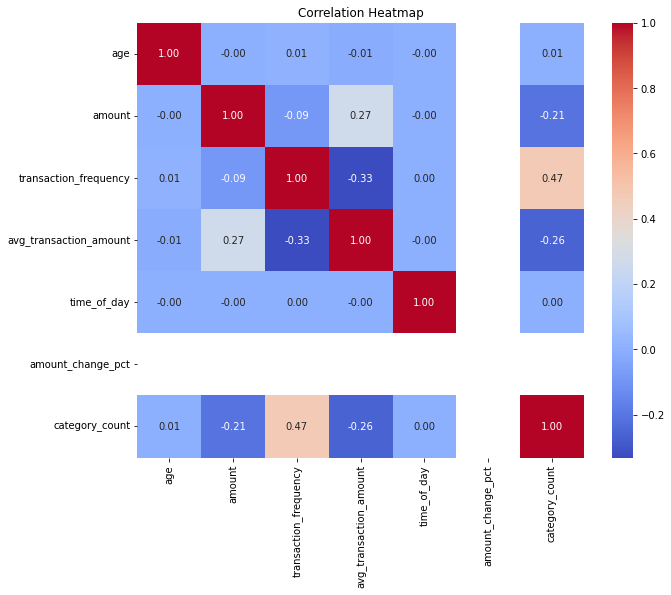

In [0]:
numerical_cols = ['age', 'amount', 'transaction_frequency', 'avg_transaction_amount', 
                   'time_of_day', 'amount_change_pct', 'category_count']
numerical_data = df1.select(numerical_cols)

#Compute correlation matrix
correlations = {}
for col1 in numerical_cols:
    correlations[col1] = []
    for col2 in numerical_cols:
        corr = numerical_data.stat.corr(col1, col2)
        correlations[col1].append(corr)

# Convert to Pandas DataFrame
correlation_matrix = pd.DataFrame(correlations, index=numerical_cols, columns=numerical_cols)

# Plot heatmap using seaborn
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm", fmt=".2f")
plt.title("Correlation Heatmap")
plt.show()


## Feature distribution

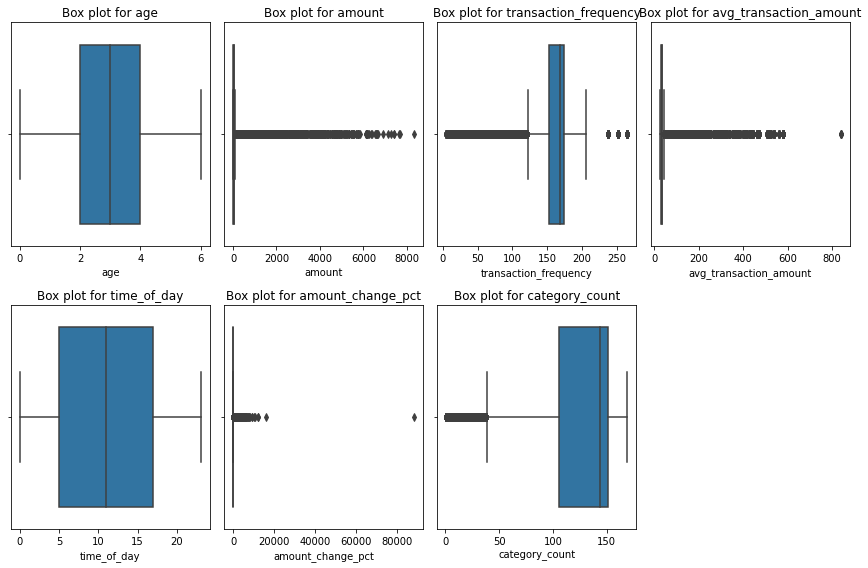

In [0]:

# Convert PySpark DataFrame to Pandas
df1_pandas = df1.select(*df1.columns).toPandas()

# Plot boxplots for each numeric feature
plt.figure(figsize=(12, 8))
for i, col in enumerate(numerical_cols, 1):
    plt.subplot(2, 4, i)
    sns.boxplot(x=df1_pandas[col])  # Use the Pandas DataFrame here
    plt.title(f"Box plot for {col}")
plt.tight_layout()
plt.show()
